# Dog Breed Identifier Model
The following notebook will be used with Google Colab to predict dog breeds. This is based on the notebook  "end-to-end-bluebook-dog-vision.ipynb" from the Udemy course "Complete ML & Data Science Bootcamp 2023."

## 1. Problem/Goal

This is a multi-class classification problem and the goal of this notebook is to train a model to successfully identify different dog breeds.

## 2. Data

The data used is from the Kaggle dog breed identification competition. There are about 10,000 labelled images for training of 120 different dog breeds and about the same amount of unlabelled data for testing.

## 3. Evaluation

We will be using Accuracy to evaluate the success of the model.

## 4. Experimentation

Please ensure to run every cell unless otherwise noted.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Download the Data
This section will download the data required for the project. Use one of the following methods:

1. Download and unzip from Dropbox

In [ ]:
#!wget https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip # download files from Dropbox as zip

#import os
#import zipfile

#local_zip = 'dog-breed-identification.zip'
#zip_ref = zipfile.ZipFile(local_zip, 'r')

#zip_ref.extractall('Dog Vision') # unzip the files into a file called "Dog Vision"
#zip_ref.close()

OR  
2. Unzip from Google Drive:

In [ ]:
!unzip "/content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification

### Project Setup

In [2]:
## Import packages
import sys
import os
import datetime
import joblib
import pandas as pd
import imageio.v2 as iio
import numpy as np
from sklearn.model_selection import train_test_split
from IPython.display import display, Image
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-darkgrid')

## Display Inline in the notebook
%matplotlib inline
%load_ext tensorboard

# Confirm GPU is working
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

TF version: 2.14.0
Hub version: 0.15.0


In [3]:
# Check for GPU
print("GPU", "Available (YES!)" if tf.config.list_physical_devices("GPU") else "Not Available :'(")

# @markdown ---
# @markdown ### Enter the file path for this project:
PRJ_PATH = "/content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/" # @param {type:"string"}
IMG_PATH = PRJ_PATH + "data/train/"
IMG_TEST_PATH = PRJ_PATH + "data/test/"
LOG_DIR = PRJ_PATH + "logs/"
MODEL_SAVE_DIR = PRJ_PATH + "models/"
MODEL_SAVE_DIR_FULL = PRJ_PATH + "models-full-dataset/"

# @markdown ---
# @markdown ### Enter the desired image size:
IMG_SIZE_HIGT = 224 # @param {type:"integer"}
IMG_SIZE_WID = 224  # @param {type:"integer"}

# @markdown ---
# @markdown ### Enter the desired Batch size:
BATCH_SIZE = 32 # @param {type:"integer"}

# Setup input shape to the model
MODEL_INPUT_SHAPE = [None, IMG_SIZE_HIGT, IMG_SIZE_WID, 3] # batch, height, width, colour channelsM
# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

GPU Available (YES!)


### Helper Functions


In [4]:
def get_full_image_paths(labels):
  """
  """
  return [IMG_PATH + filename + ".jpg" for filename in labels["id"]]

def get_full_test_image_paths(filenames):
  """
  """
  return [IMG_TEST_PATH + filename for filename in filenames]

def preprocess_imgs(filename):
  """ Resizes and Converts images to tensors
  1. Takes an image filename as input.
  2. Uses TensorFlow to read the file and save it to a variable, image.
  3. Turn our image (a jpeg file) into Tensors.
  4. Resize the image to be of shape (IMG_SIZE_HIGT, IMG_SIZE_WID).
  5. Return the modified image.
  """
  # Read image file
  image = tf.io.read_file(filename)
  # Turn jpeg into Tensor with 3 colour channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert colour channel values to be between 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image desired size (IMG_SIZE_HIGT, IMG_SIZE_WID)
  return tf.image.resize(image, size=[IMG_SIZE_HIGT, IMG_SIZE_WID])

def get_img_lbl_tuple(img_path, label):
  """ Returns a tuple of a processed image and it's label
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  return preprocess_imgs(img_path), label

def batch_data(x, y=None, data_type="train"):
  """ Returns input data in batches, where x is the full path to images and y are the labels
  When data_type is:
    - "test": y (labels) is not required, and data is not shuffled
    - "valid": y (labels) is required and data is not shuffled
    - "train": y (labels) is required and data is shuffled
  """
  data = None
  databatch = None
  if data_type == "test":
    print("Creating test data batches...")
    if y:
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
      databatch = data.map(get_img_lbl_tuple).batch(BATCH_SIZE)
    else:
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
      databatch = data.map(preprocess_imgs).batch(BATCH_SIZE)
  elif data_type == "valid":
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    databatch = data.map(get_img_lbl_tuple).batch(BATCH_SIZE)
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))
    databatch = data.map(get_img_lbl_tuple).batch(BATCH_SIZE)
  return databatch

Ensure Data is correct:

In [5]:
# Import Labels
labels_pd = pd.read_csv(PRJ_PATH+"data/labels.csv")
fullFilePaths = get_full_image_paths(labels_pd)

breeds_np =  labels_pd["breed"].to_numpy()

# Ensure File Paths Count Match Images Count and Labels
print("File paths and Imgs Match!" if len(os.listdir(IMG_PATH)) == len(fullFilePaths) else "File paths and Imgs Mismatch lengths")
print("Labels and Files Match!" if len(breeds_np) == len(fullFilePaths) else "Labels and Files Mismatch")
print(f"There are {len(np.unique(breeds_np))} different breeds.")
print(len(os.listdir(IMG_PATH)))

File paths and Imgs Match!
Labels and Files Match!
There are 120 different breeds.
10222


### Data Exploration

In [ ]:
# View Labels
print(labels_pd.describe())
labels_pd.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Breed Distribution
labels_pd["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

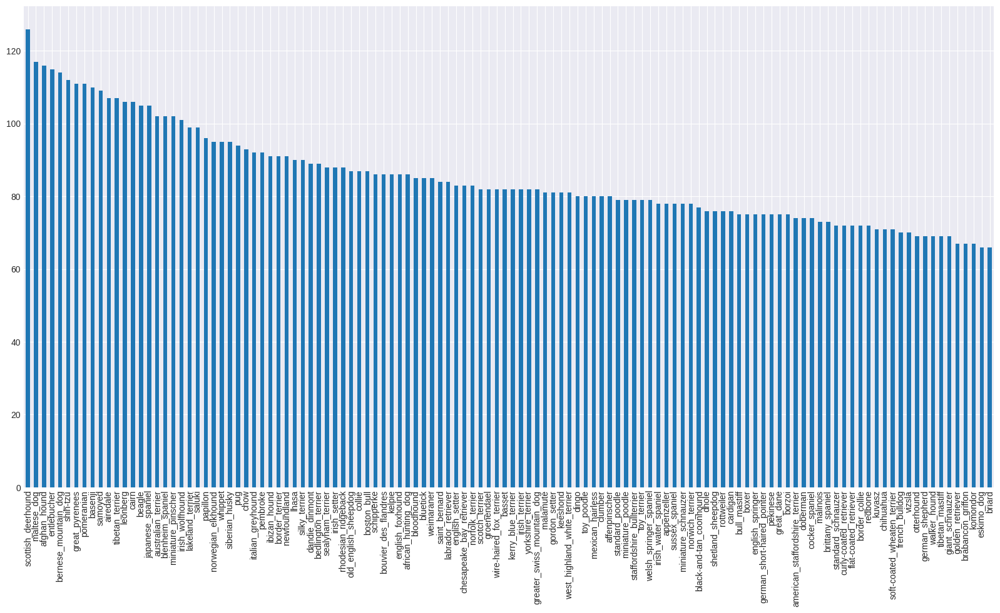

In [ ]:
labels_pd["breed"].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
# View full paths, label and breed
fullFilePaths[:3], labels_pd["breed"][:3], breeds_np[0]

NameError: ignored

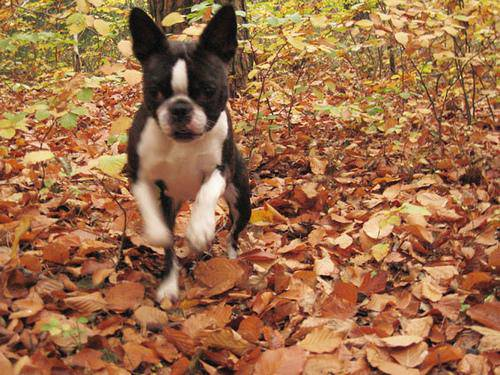

In [ ]:
Image(fullFilePaths[0])

### Data Pre-processing

In [6]:
# Setup data vars
labels_pd = pd.read_csv(PRJ_PATH+"data/labels.csv")
fullFilePaths = get_full_image_paths(labels_pd)
breeds_np =  labels_pd["breed"].to_numpy()
unique_breeds = np.unique(breeds_np)



In [7]:
# Convert Breed Labels to Bools

breeds_bool = [breed == np.array(unique_breeds) for breed in breeds_np]
print(breeds_np[0]+": ", np.where(breeds_bool[0] == True)[0], np.where(unique_breeds == breeds_np[0])[0])
print(breeds_bool[0])

boston_bull:  [19] [19]
[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


#### Creating Train and Validate Data Sets

In [8]:
X = fullFilePaths
y = breeds_bool

In [ ]:
# Select # of imgs for training during experimentation
IMGS_COUNT = 1000 # @param {type:"slider", min:1000, max:10221}
print(IMGS_COUNT)

1000


In [ ]:
# Split Data
X_train, X_val, y_train, y_val = train_test_split(X[:IMGS_COUNT],
                                                  y[:IMGS_COUNT],
                                                  test_size=0.2,
                                                  random_state=1995)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

#### Images Pre-processing and Data Batching

In [ ]:
data_batch_train = batch_data(X_train, y_train)
data_batch_val = batch_data(X_val, y_val, data_type="valid")

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
data_batch_train.element_spec, data_batch_val.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

##### Visualize Data Batches

In [ ]:

def show_x_images(images, labels, img_count=25):
  """
  Displays SHOW_X_IMGS images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(15, 15))
  # Loop through 25 (for displaying 25 images)
  for i in range(img_count):
    # Create subplots (5 rows, 5 columns)
    col = 5
    row = int(img_count/5)
    ax = plt.subplot(row, col, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

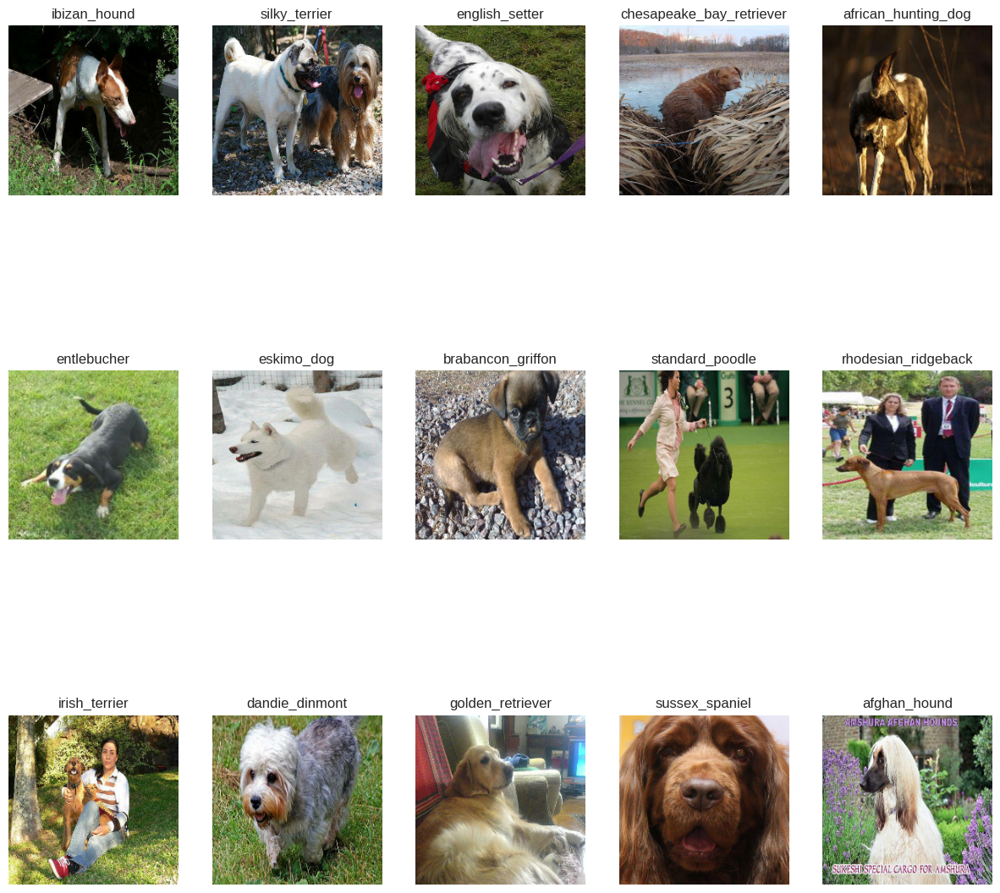

In [ ]:
SHOW_X_IMGS = 15 # @param {type:"slider", min:5, max:30, step:5}
# Visualize training images from the training data batch
train_images, train_labels = next(data_batch_train.as_numpy_iterator())
show_x_images(train_images, train_labels, SHOW_X_IMGS)

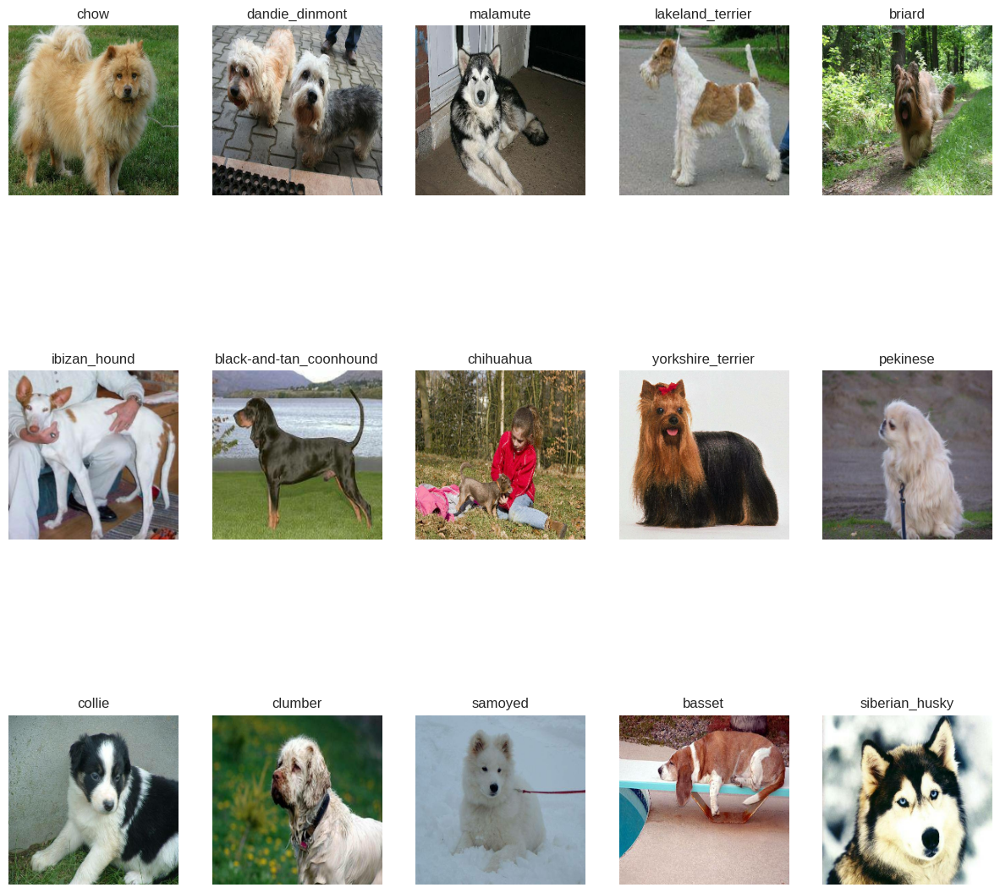

In [ ]:
SHOW_X_IMGS = 15 # @param {type:"slider", min:5, max:30, step:5}
# Visualize training images from the training data batch
val_images, val_labels = next(data_batch_val.as_numpy_iterator())
show_x_images(val_images, val_labels, SHOW_X_IMGS)

### Build the Model

In [ ]:
# Setup output shape of the model
MODEL_OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

def create_dog_model(dog_model=None):
  print("Building Dog Identification Model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=MODEL_OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # want to reduce how wrong model guesses are
      optimizer=tf.keras.optimizers.Adam(), # tells our model how to improve it's guesses
      metrics=["accuracy"] # maximize this
  )
  # return built model
  model.build(MODEL_INPUT_SHAPE)

  if os.listdir(MODEL_SAVE_DIR) and dog_model:
    latest = tf.train.latest_checkpoint(MODEL_SAVE_DIR)
    print("Loading latest model: ", latest)
    dog_model.load_weights(latest)
  return model

Create New Model

In [ ]:
dog_model = create_dog_model()
# load saved model if applicable
dog_model = create_dog_model(dog_model)
dog_model.summary()

Building Dog Identification Model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Building Dog Identification Model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Loading latest model:  /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models/dogmodel-0014.ckpt
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Train the Model

In [ ]:
## Helper Functions
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  logdir = os.path.join(LOG_DIR,
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

def create_early_stoping_callback(patience_count=3):
  return tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=patience_count)

def create_save_callback(freq='epoch'):
  ckpt_path = MODEL_SAVE_DIR+"dogmodel-{epoch:04d}.ckpt"
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=ckpt_path,
    save_freq=freq,
    save_weights_only=True,
    verbose=1
    )

def train_model(model):
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_dog_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  early_stopping = create_early_stoping_callback()
  saving = create_save_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=data_batch_train,
            epochs=NUM_EPOCHS,
            validation_data=data_batch_val,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping, saving])

  return model

In [ ]:
NUM_EPOCHS = 20 #@param {type:"slider", min:10, max:100, step:10}
dog_model = train_model(dog_model)

Building Dog Identification Model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/20
25/25 [==============================] - ETA: 0s - loss: 4.4751 - accuracy: 0.0962
Epoch 1: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models/dogmodel-0001.ckpt
25/25 [==============================] - 17s 189ms/step - loss: 4.4751 - accuracy: 0.0962 - val_loss: 3.2253 - val_accuracy: 0.3150
Epoch 2/20
25/25 [==============================] - ETA: 0s - loss: 1.6083 - accuracy: 0.6900
Epoch 2: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models/dogmodel-0002.ckpt
25/25 [==============================] - 3s 137ms/step - loss: 1.6083 - accuracy: 0.6900 - val_loss: 2.0183 - val_accuracy: 0.5650
Epoch 3/20
25/25 [==============================] - ETA: 0s - loss: 0.5660 - accuracy: 0.9375
Epoch 3: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models/dogmodel-0003.ckpt
25/

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/DogBreedIdentification/logs --load_fast=false --port=8008

Output hidden; open in https://colab.research.google.com to view.

### Model Predictions

In [39]:
## Helper Functions

def get_prediction_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

def unbatch_data(data, is_test=False):
  """
  Takes batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  if is_test:
    for image in data.unbatch().as_numpy_iterator():
      images.append(image)
    return images

  else:
    for image, label in data.unbatch().as_numpy_iterator():
      images.append(image)
      labels.append(unique_breeds[np.argmax(label)])
    return images, labels

def plot_prediction(prediction_probabilities, images, labels=None, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  if labels:
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_prediction_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
      color = "green"
    else:
      color = "red"

    plt.title("{} {:2.0f}% ({})".format(pred_label,
                                        np.max(pred_prob)*100,
                                        true_label),
                                        color=color)
  else:
    pred_label = get_prediction_label(prediction_probabilities[n])
    pred_prob = prediction_probabilities[n]
    image = iio.imread(images[n])
    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    plt.title("{} {:2.0f}%".format(pred_label, np.max(pred_prob)*100))


def plot_pred_conf(prediction_probabilities, labels=None, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """

  if labels:
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_prediction_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")

    # Change color of true label
    if np.isin(true_label, top_10_pred_labels):
      top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
      pass
  else:
     pred_label = get_prediction_label(prediction_probabilities[n])
     pred_prob = prediction_probabilities[n]
     # Find the top 10 prediction confidence indexes
     top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
     # Find the top 10 prediction confidence values
     top_10_pred_values = pred_prob[top_10_pred_indexes]
     # Find the top 10 prediction labels
     top_10_pred_labels = unique_breeds[top_10_pred_indexes]

     # Setup plot
     top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color="grey")
     plt.xticks(np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")

def display_img_conf(i_multiplier=0, num_rows=3, num_cols=2, ):
  num_images = num_rows*num_cols
  plt.figure(figsize=(5*2*num_cols, 5*num_rows))
  for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_prediction(prediction_probabilities=predictions,
              labels=unbatched_val_labels,
              images=unbatched_val_imgs,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                  labels=unbatched_val_labels,
                  n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  plt.show()

In [ ]:
predictions = dog_model.predict(data_batch_val, verbose=1)
predictions.shape

7/7 [==============================] - 1s 82ms/step


(200, 120)

In [ ]:
PRED_INDX = 31 #@param {type:"slider", min:0, max:100, step:1}
print(f"Max value (probability of prediction): {np.max(predictions[PRED_INDX])}")
print(f"Sum: {np.sum(predictions[PRED_INDX])}")
print(f"Max index: {np.argmax(predictions[PRED_INDX])}")
print(f"Predicted label: {get_prediction_label(predictions[PRED_INDX])}")

Max value (probability of prediction): 0.7671118378639221
Sum: 0.9999999403953552
Max index: 29
Predicted label: chihuahua


(200, 200)

Acc 68.5% loss 1.178  
- 800 img training  
- 200 img validation  
- 25 epochs training

Acc 72.0% loss 1.1148
- Loaded Saved Model
- 20 epochs training

In [ ]:
acc_prelim = dog_model.evaluate(data_batch_val, verbose=1)
acc_prelim

7/7 [==============================] - 1s 98ms/step - loss: 1.1148 - accuracy: 0.7200


[1.1148395538330078, 0.7200000286102295]

#### Visualization

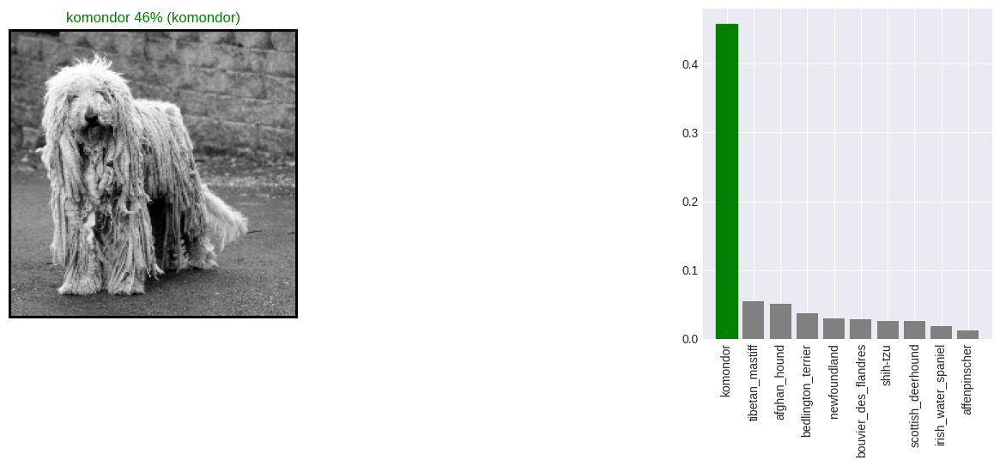

In [ ]:
IMG_INDEX=53 # @param {type:"slider", min:0, max:199}

unbatched_val_imgs, unbatched_val_labels = unbatch_data(data_batch_val)
len(unbatched_val_imgs), len(unbatched_val_labels)

plt.figure(figsize=(20, 5))
plt.subplot(1, 4, 2)
plot_prediction(prediction_probabilities=predictions,
          images=unbatched_val_imgs,
          labels=unbatched_val_labels, n=IMG_INDEX)
plt.subplot(1, 4, 4)
plot_pred_conf(prediction_probabilities=predictions,
               labels=unbatched_val_labels,
               n=IMG_INDEX)
plt.show()

## Full Model

In [11]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join(MODEL_SAVE_DIR_FULL,
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

def create_save_callback_fullmodel(freq='epoch'):
  ckpt_path = MODEL_SAVE_DIR_FULL+"dogmodel-{epoch:04d}.ckpt"
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=ckpt_path,
    save_freq=freq,
    save_weights_only=True,
    verbose=1
    )

### Training on full dataset

In [12]:
full_data = batch_data(X, y)
full_model = create_dog_model()

full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = create_early_stoping_callback()
full_model_saving = create_save_callback_fullmodel()

Creating training data batches...


NameError: ignored

After 20 epochs:
- Accuracy: 0.9990  
- Loss: 0.0104

In [ ]:
NUM_EPOCHS = 50 # @param {type:"slider", min:10, max:100, steps:10}
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_saving,
                          full_model_early_stopping])

Epoch 1/50
320/320 [==============================] - ETA: 0s - loss: 1.3301 - accuracy: 0.6726
Epoch 1: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0001.ckpt


320/320 [==============================] - 41s 115ms/step - loss: 1.3301 - accuracy: 0.6726
Epoch 2/50
319/320 [============================>.] - ETA: 0s - loss: 0.3966 - accuracy: 0.8815
Epoch 2: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0002.ckpt


320/320 [==============================] - 37s 115ms/step - loss: 0.3962 - accuracy: 0.8816
Epoch 3/50
319/320 [============================>.] - ETA: 0s - loss: 0.2354 - accuracy: 0.9357
Epoch 3: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0003.ckpt


320/320 [==============================] - 34s 105ms/step - loss: 0.2355 - accuracy: 0.9355
Epoch 4/50
319/320 [============================>.] - ETA: 0s - loss: 0.1508 - accuracy: 0.9640
Epoch 4: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0004.ckpt


320/320 [==============================] - 34s 105ms/step - loss: 0.1506 - accuracy: 0.9641
Epoch 5/50
319/320 [============================>.] - ETA: 0s - loss: 0.1051 - accuracy: 0.9781
Epoch 5: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0005.ckpt


320/320 [==============================] - 33s 104ms/step - loss: 0.1050 - accuracy: 0.9781
Epoch 6/50
319/320 [============================>.] - ETA: 0s - loss: 0.0761 - accuracy: 0.9868
Epoch 6: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0006.ckpt


320/320 [==============================] - 32s 100ms/step - loss: 0.0761 - accuracy: 0.9868
Epoch 7/50
320/320 [==============================] - ETA: 0s - loss: 0.0574 - accuracy: 0.9916
Epoch 7: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0007.ckpt


320/320 [==============================] - 33s 103ms/step - loss: 0.0574 - accuracy: 0.9916
Epoch 8/50
319/320 [============================>.] - ETA: 0s - loss: 0.0466 - accuracy: 0.9941
Epoch 8: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0008.ckpt


320/320 [==============================] - 32s 101ms/step - loss: 0.0467 - accuracy: 0.9941
Epoch 9/50
319/320 [============================>.] - ETA: 0s - loss: 0.0356 - accuracy: 0.9970
Epoch 9: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0009.ckpt


320/320 [==============================] - 32s 99ms/step - loss: 0.0355 - accuracy: 0.9970
Epoch 10/50
319/320 [============================>.] - ETA: 0s - loss: 0.0305 - accuracy: 0.9973
Epoch 10: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0010.ckpt


320/320 [==============================] - 33s 103ms/step - loss: 0.0305 - accuracy: 0.9973
Epoch 11/50
320/320 [==============================] - ETA: 0s - loss: 0.0256 - accuracy: 0.9980
Epoch 11: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0011.ckpt


320/320 [==============================] - 43s 135ms/step - loss: 0.0256 - accuracy: 0.9980
Epoch 12/50
319/320 [============================>.] - ETA: 0s - loss: 0.0230 - accuracy: 0.9976
Epoch 12: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0012.ckpt


320/320 [==============================] - 35s 108ms/step - loss: 0.0230 - accuracy: 0.9976
Epoch 13/50
319/320 [============================>.] - ETA: 0s - loss: 0.0212 - accuracy: 0.9979
Epoch 13: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0013.ckpt


320/320 [==============================] - 33s 103ms/step - loss: 0.0212 - accuracy: 0.9979
Epoch 14/50
319/320 [============================>.] - ETA: 0s - loss: 0.0179 - accuracy: 0.9989
Epoch 14: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0014.ckpt


320/320 [==============================] - 35s 109ms/step - loss: 0.0179 - accuracy: 0.9989
Epoch 15/50
320/320 [==============================] - ETA: 0s - loss: 0.0150 - accuracy: 0.9986
Epoch 15: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0015.ckpt


320/320 [==============================] - 34s 108ms/step - loss: 0.0150 - accuracy: 0.9986
Epoch 16/50
319/320 [============================>.] - ETA: 0s - loss: 0.0139 - accuracy: 0.9989
Epoch 16: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0016.ckpt


320/320 [==============================] - 33s 103ms/step - loss: 0.0139 - accuracy: 0.9989
Epoch 17/50
319/320 [============================>.] - ETA: 0s - loss: 0.0120 - accuracy: 0.9990
Epoch 17: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0017.ckpt


320/320 [==============================] - 33s 102ms/step - loss: 0.0120 - accuracy: 0.9990
Epoch 18/50
319/320 [============================>.] - ETA: 0s - loss: 0.0109 - accuracy: 0.9990
Epoch 18: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0018.ckpt


320/320 [==============================] - 33s 101ms/step - loss: 0.0108 - accuracy: 0.9990
Epoch 19/50
319/320 [============================>.] - ETA: 0s - loss: 0.0113 - accuracy: 0.9990
Epoch 19: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0019.ckpt


320/320 [==============================] - 33s 104ms/step - loss: 0.0112 - accuracy: 0.9990
Epoch 20/50
320/320 [==============================] - ETA: 0s - loss: 0.0104 - accuracy: 0.9990
Epoch 20: saving model to /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models-full-dataset/dogmodel-0020.ckpt


320/320 [==============================] - 34s 106ms/step - loss: 0.0104 - accuracy: 0.9990


KeyboardInterrupt: ignored

In [ ]:
full_model_filepath = save_model(full_model, suffix="all-images-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models/20231127-17461701107185-all-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Predictions

In [13]:
full_model_filepath = '/content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models/20231127-17461701107185-all-images-Adam.h5'
loaded_full_model = load_model(full_model_filepath)

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/models/20231127-17461701107185-all-images-Adam.h5


In [14]:
filenames_test = os.listdir(IMG_TEST_PATH)
full_filenames_test = get_full_test_image_paths(filenames_test)
filenames_test[0], full_filenames_test[0], len(full_filenames_test)

('e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogBreedIdentification/data/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 10357)

In [15]:
# Batch Test Data
test_batch = batch_data(full_filenames_test, data_type='test')

Creating test data batches...


In [ ]:
test_batch.element_spec

TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)

In [17]:
# Make predictions
test_predictions = loaded_full_model.predict(test_batch,
                                             verbose=1)

324/324 [==============================] - 157s 443ms/step


In [ ]:
test_predictions[:10]

array([[4.62157916e-11, 1.10711605e-11, 1.71091982e-14, ...,
        1.48854765e-13, 1.25948874e-09, 1.36847089e-10],
       [1.25960992e-06, 3.32796873e-07, 2.19126424e-08, ...,
        2.62511800e-11, 5.34232321e-08, 5.25399779e-10],
       [3.54911350e-10, 8.82695588e-07, 1.15488312e-08, ...,
        2.05719834e-06, 9.51426923e-11, 5.02615310e-11],
       ...,
       [7.07196690e-10, 4.70973018e-11, 5.01880100e-11, ...,
        4.43244427e-13, 4.15415451e-13, 1.60954531e-11],
       [6.26902827e-12, 5.23764226e-11, 1.24061560e-11, ...,
        1.33426215e-06, 8.21109225e-09, 3.61397474e-11],
       [1.30653377e-09, 1.11447761e-11, 6.33924684e-12, ...,
        2.12108963e-13, 1.18111548e-10, 2.95623348e-08]], dtype=float32)

In [18]:
# Create PD Dataframe
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df["id"] = [os.path.splitext(path)[0] for path in filenames_test]
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e008da6b957c62e7bcf6eb2ba4c2abd9,9.077339e-08,1.413574e-10,3.247613e-08,1.984259e-10,3.330712e-06,2.036863e-09,1.459890e-09,5.994275e-08,1.620314e-07,...,1.314013e-06,6.419798e-06,4.834054e-10,1.206812e-07,1.804911e-10,1.545475e-07,9.894789e-01,5.214649e-07,7.603296e-04,6.696032e-06
1,e646ac89e0832502f9a726c72773cfcc,1.274900e-04,5.209513e-08,5.090890e-09,1.979497e-11,7.690770e-05,2.403740e-08,9.570017e-08,2.001307e-06,1.888462e-09,...,8.903316e-04,7.045248e-07,9.445754e-09,1.350875e-06,6.985190e-09,5.227380e-08,2.542762e-04,3.306199e-06,2.418920e-06,1.789906e-05
2,e2b6d4957b62934bd831c3a1b65e2ebb,2.197927e-12,2.501002e-09,7.377614e-12,5.952071e-10,2.146510e-11,3.138611e-13,3.298592e-16,7.751135e-12,6.810825e-12,...,5.986397e-10,3.260615e-13,4.851884e-13,8.759165e-15,1.711160e-12,2.841357e-12,4.361460e-14,1.935144e-09,1.535862e-11,1.147639e-10
3,e2caef2df1087702936298aaac7843a1,1.841853e-13,2.561534e-09,1.219866e-13,1.070238e-14,1.728004e-11,9.851530e-14,2.680033e-14,1.333094e-11,4.932407e-15,...,1.681552e-13,5.717160e-13,2.146452e-13,2.003129e-10,5.745388e-12,1.607309e-12,6.977559e-12,1.480193e-13,3.519401e-12,2.013718e-13
4,e1f7ec4bd372612f53411026aaabf233,5.123284e-11,1.029582e-10,2.453067e-12,7.985870e-15,4.451139e-09,4.590739e-11,7.469858e-12,9.101895e-09,3.828218e-13,...,7.638036e-12,1.901719e-11,2.908147e-13,1.210588e-10,2.680848e-10,2.551119e-11,3.861360e-08,4.295150e-14,1.173162e-12,7.556965e-14


In [19]:
# Export to CSV
preds_df.to_csv('full_dogbreedidentifier_test_res.csv',
                 index=False)

#### Visualization

In [22]:
unbatched_test_imgs = unbatch_data(test_batch, is_test=True)
len(unbatched_test_imgs)

10357

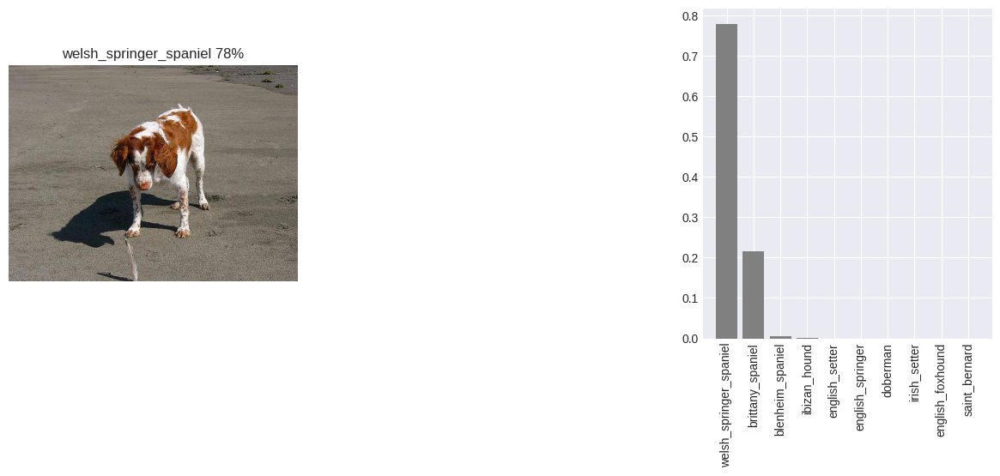

In [43]:
TEST_IMG_INDEX = 1001 # @param {type:"integer", min:0, max:10357}

plt.figure(figsize=(20, 5))
plt.subplot(1, 4, 2)
plot_prediction(prediction_probabilities=test_predictions,
          images=full_filenames_test, n=TEST_IMG_INDEX)

plt.subplot(1, 4, 4)
plot_pred_conf(prediction_probabilities=test_predictions,
               n=TEST_IMG_INDEX)
plt.show()